# Solution Chapter 6


In this exercise, we want to to fine-tune our local neighborhood distance calculation parameters for follow up experiments. The idea is to try out many different distance parameters and see how they influence the correlation between growth rate and density

-   for this we calculate the local neighborhood with different distance cutoffs (10,25,50,100,200,400) once with including empty space in the calculation and once without
-   we then create a spatial maps plot for each showing coloring by the density (use position 3 at frame 10 as reference plot)
-   in addition, we plot an xy correlation of growth rate vs density on data aggregated on the experiment level


In [27]:
from fluid_experiment.fluid_experiment import FluidExperiment
PATH = "../../../data/midap-tools_example"
experiment = FluidExperiment(PATH,name = "example_experiment")
experiment.load_metadata_template()
experiment.filter_data("frame", max_value = 20) #in this experiment cells were only growing in the first 20 frames
experiment.filter_data("trackID", min_occurences = 3)
experiment.calculate_transform_data(column = "major_axis_length")
experiment.calculate_growth_rate(integration_window = 3, id_column= "trackID",value_column="major_axis_length_log")
print(experiment)

#YOUR CODE BELOW

#we first define our distance cutoffs
distances = [10,25,50,100,200,400]
#we then define our use empty selections
use_empty = [True,False]

#in a double loop, we go through all distances and emtpy selections and create a new column in our dataframes with the name density_distance_useempty_channel
#Warning, this may take some time (ca. 10 minutes) to run all combinations
for d in distances:
    for e in use_empty:
        experiment.calculate_local_neighborhood(distance_threshold=d, neighborhood_prefix=  f"density_{d}_{e}_", include_empty=e)

Loading sample at position pos1 for color channel YFP
Loading sample at position pos1 for color channel CFP
Loading sample at position pos2 for color channel YFP
Loading sample at position pos2 for color channel CFP
Loading sample at position pos3 for color channel YFP
Loading sample at position pos3 for color channel CFP
Loading sample at position pos4 for color channel YFP
Loading sample at position pos4 for color channel CFP
Loading sample at position pos5 for color channel YFP
Loading sample at position pos5 for color channel CFP
Loading sample at position pos6 for color channel YFP
Loading sample at position pos6 for color channel CFP
Successfully loaded data with consistent number of frames: 143
Filtering out frame with less than 0 occurences
Filtering out frame with min value None and max value 20
Filtering channel YFP at position pos1:
Filtering channel CFP at position pos1:
Filtering channel YFP at position pos2:
Filtering channel CFP at position pos2:
Filtering channel YFP at

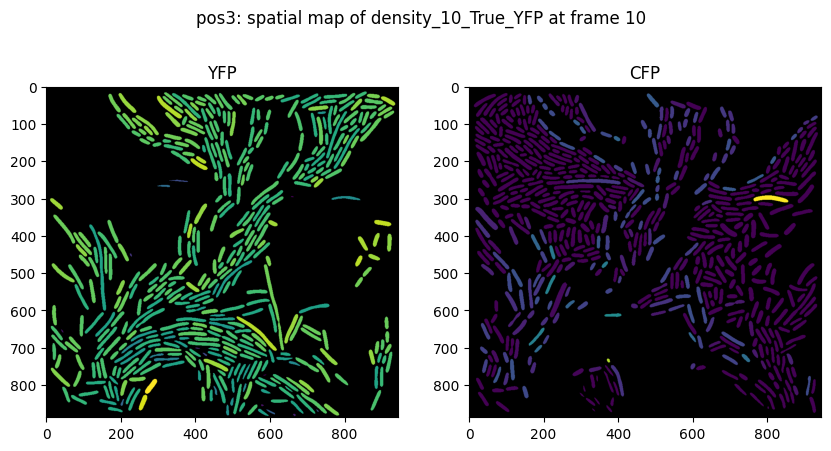

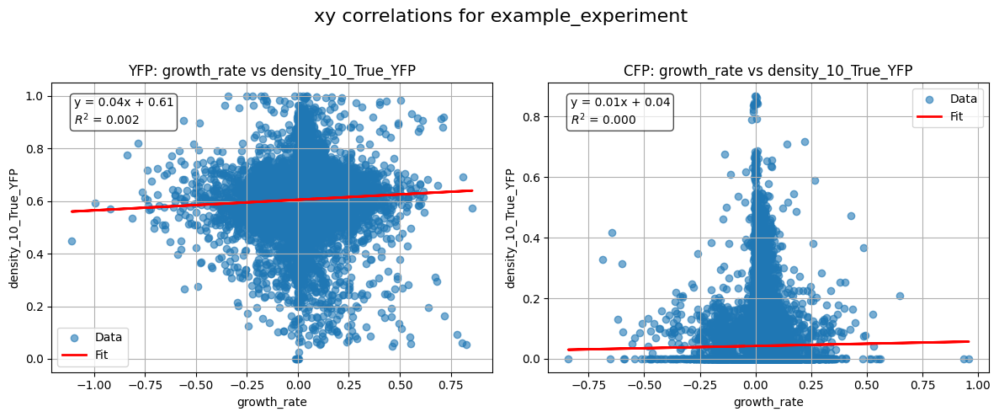

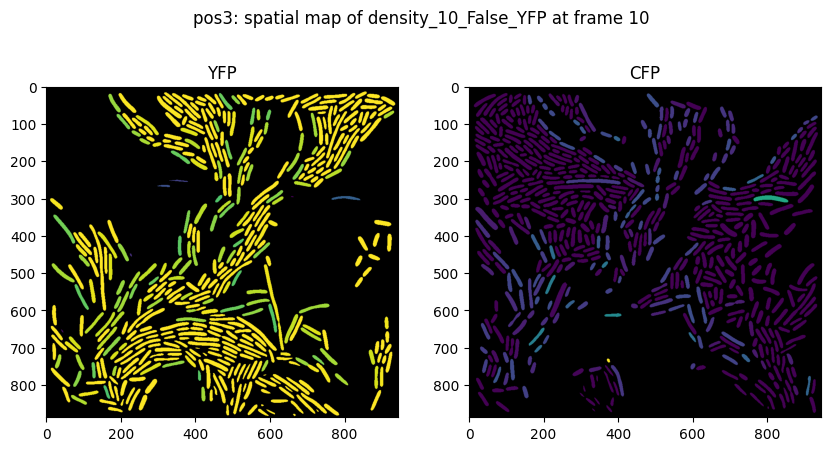

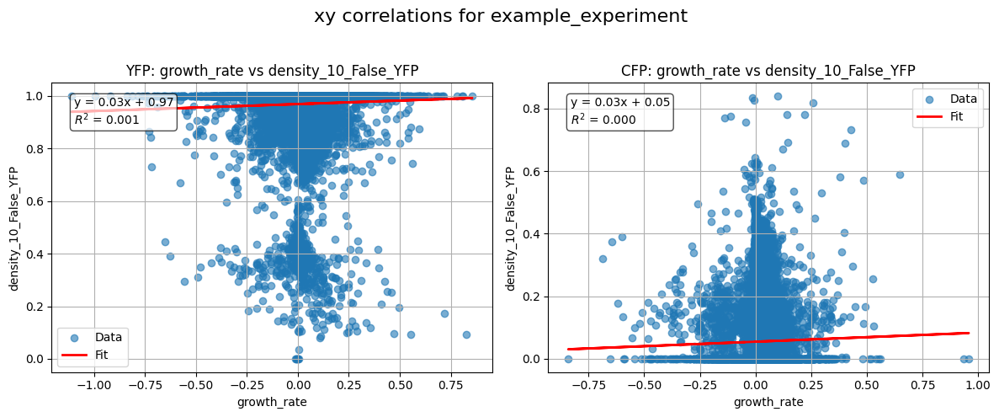

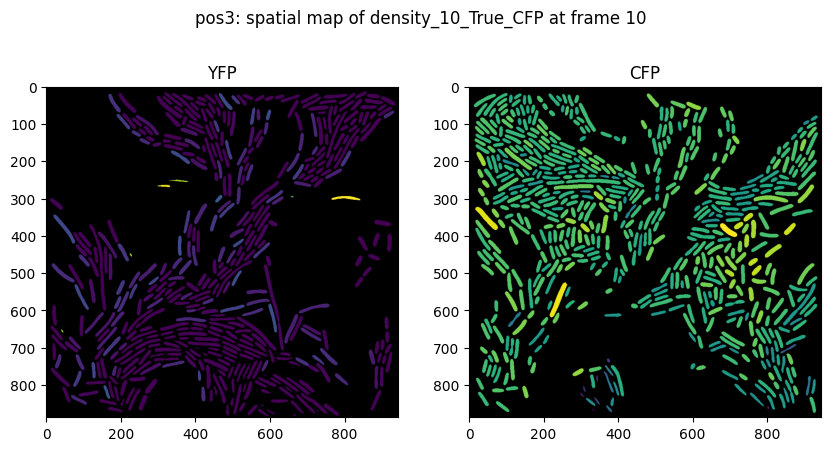

...

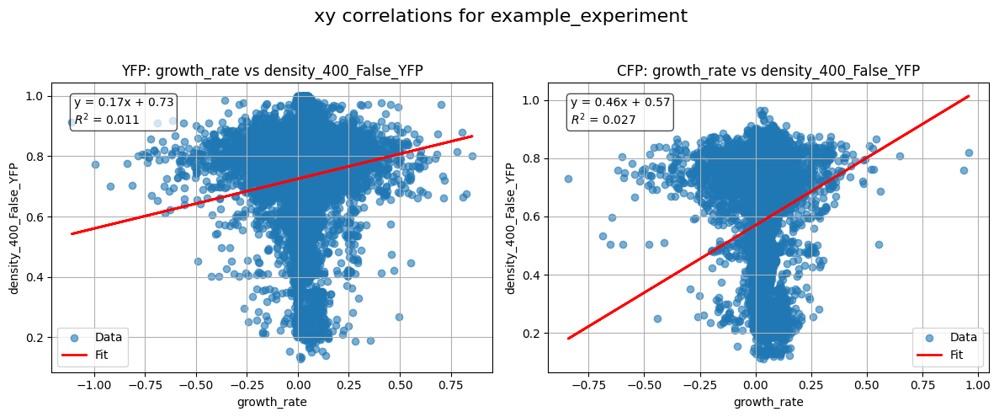

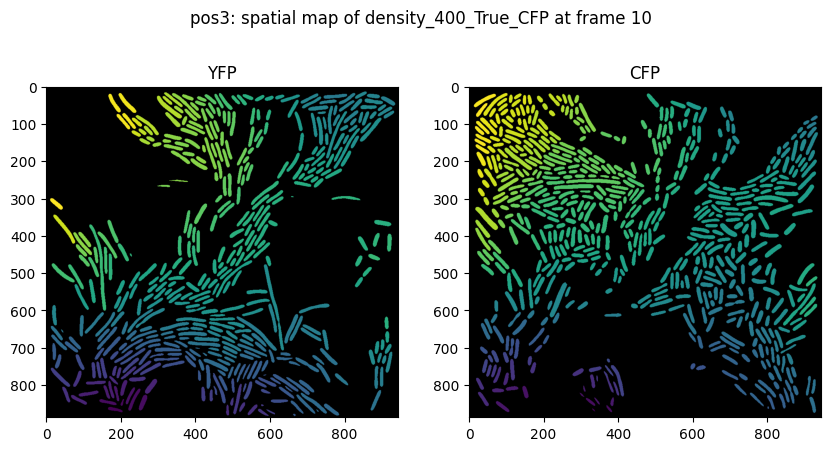

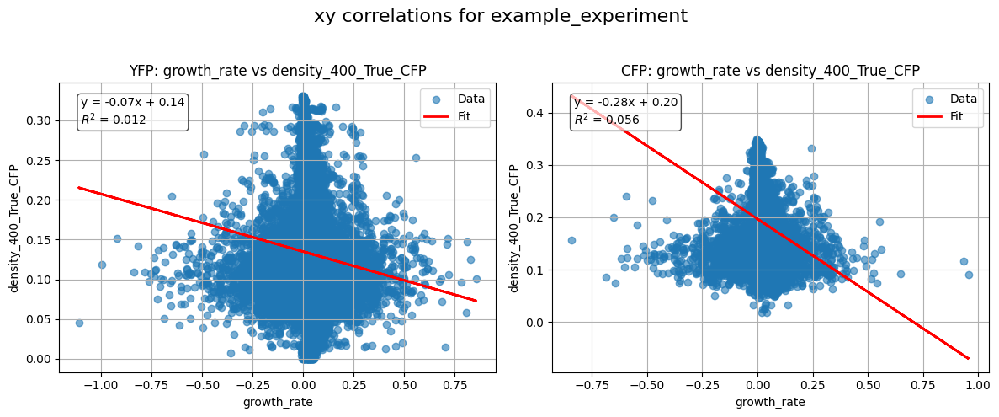

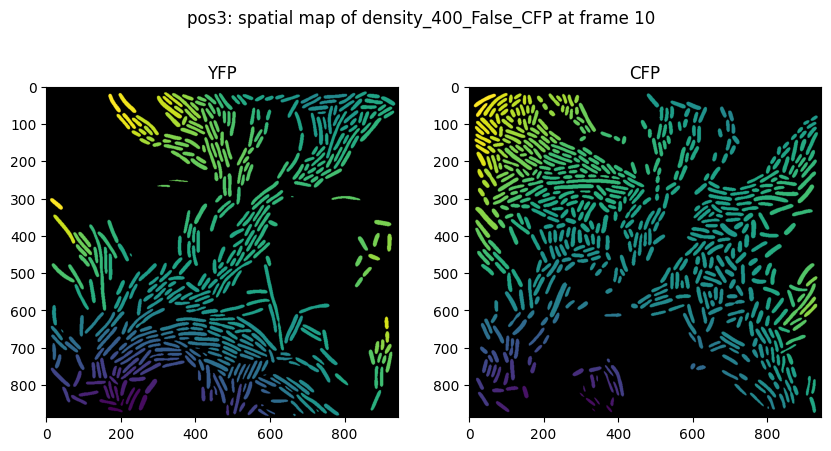

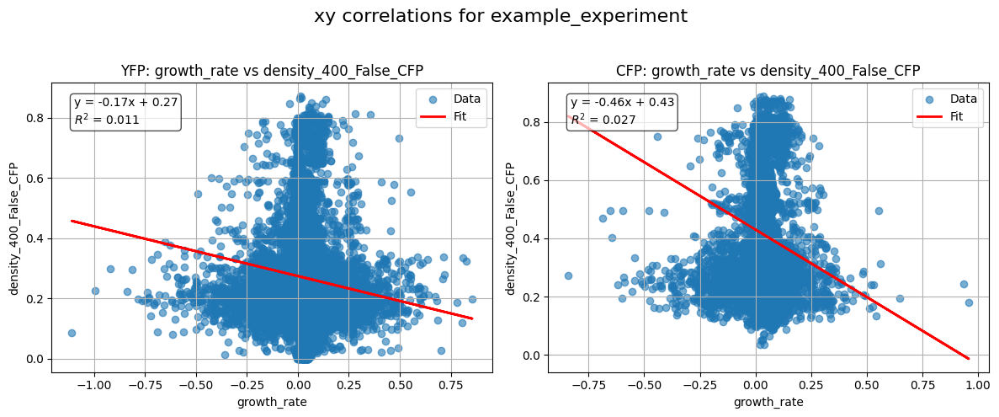

In [30]:

#In a 2nd nested loop we create all plots
#note, in this loop we also have to loop over the color_channels

color_channels = ["YFP","CFP"]
for d in distances:
    for c in color_channels:
        for e in use_empty:
            experiment.plot_spatial_maps(frame = 10,property_column = f"density_{d}_{e}_{c}",positions = "pos3")
            experiment.plot_xy_correlation(y_column = f"density_{d}_{e}_{c}", x_column = "growth_rate", group_by= "experiment")
            